In [2]:
from datasets import load_dataset, Dataset, DatasetDict, load_from_disk
data = load_from_disk('alpaca_data.hf')

In [3]:
data

DatasetDict({
    train: Dataset({
        features: ['instruction', 'input', 'output'],
        num_rows: 41601
    })
    validation: Dataset({
        features: ['instruction', 'input', 'output'],
        num_rows: 10401
    })
})

In [6]:
data['train'][2]

{'instruction': 'From a long list of items below, generate a shorter list that meets some specific criteria. Output the shorter list directly.',
 'input': '1. T-shirts\n2. Jeans\n3. Sandals\n4. Dress shoes\n5. Sneakers\n6. Polo shirts\n7. Suits',
 'output': 'T-shirts, Jeans, Sandals, Sneakers, Polo shirts.'}

In [7]:
from sklearn.model_selection import train_test_split

a = train_test_split(data['train'], test_size=0.2, random_state=42)
print(a)
# X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

[{'instruction': ['Divide the big number into the smallest possible number of 3-digit numbers.', 'Compose an epitaph for a beloved grandmother.', 'From a long list of items below, generate a shorter list that meets some specific criteria. Output the shorter list directly.', 'Categorize the following sentence into the appropriate genre: fiction, non-fiction, or mystery.', 'Create a a punchline based on the given statement.', 'Generate an acronym for the words Common Complex Occurrences', 'We want to set up a vacation alert on our emails from March to October. How can we do it?', 'Explain what a computer algorithm is.', 'Come up with a way to use common household items to create a musical instrument.', 'Design a logo for a sports equipment store.', 'Compose a love poem for someone special.', "Create a style guide outlining the do's and don'ts for using a specific font.", 'Explain what a web crawler does', 'Design a machine learning algorithm for predicting stock prices.', 'List three mac

In [ ]:
dataset = DatasetDict({
    'train': Dataset.from_dict({
        'caption': X_train,
        'tag': y_train
    }),
    'validation': Dataset.from_dict({
        'caption': X_val,
        'tag': y_val
    }),
    'test': Dataset.from_dict({
        'caption': X_test,
        'tag': y_test
    })
})

In [1]:
from datasets import load_dataset
from transformers import LLaMATokenizer


tokenizer = LLaMATokenizer.from_pretrained("decapoda-research/llama-7b-hf", add_eos_token=True)
tokenizer.pad_token = tokenizer.eos_token
tokenizer.pad_token_id = tokenizer.eos_token_id

data = load_dataset("json", data_files="alpaca_data.json")


def generate_prompt(data_point):
    # sorry about the formatting disaster gotta move fast
    if data_point["instruction"]:
        return f"""Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.

### Instruction:
{data_point["instruction"]}

### Input:
{data_point["input"]}

### Response:
{data_point["output"]}"""
    else:
        return f"""Below is an instruction that describes a task. Write a response that appropriately completes the request.

### Instruction:
{data_point["instruction"]}

### Response:
{data_point["output"]}"""


data = data.map(lambda data_point: {"prompt": tokenizer(generate_prompt(data_point))})

/home/eric/miniconda3/envs/dl3/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Found cached dataset json (/home/eric/.cache/huggingface/datasets/json/default-789f51900889f651/0.0.0/0f7e3662623656454fcd2b650f34e886a7db4b9104504885bd462096cc7a9f51)
100%|██████████| 1/1 [00:00<00:00, 703.62it/s]
Loading cached processed dataset at /home/eric/.cache/huggingface/datasets/json/default-789f51900889f651/0.0.0/0f7e3662623656454fcd2b650f34e886a7db4b9104504885bd462096cc7a9f51/cache-0d61d5bdc68bbe36.arrow


(array([4.2516e+04, 8.2500e+03, 9.8300e+02, 1.9100e+02, 3.5000e+01,
        1.6000e+01, 9.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00]),
 array([  60. ,  184.5,  309. ,  433.5,  558. ,  682.5,  807. ,  931.5,
        1056. , 1180.5, 1305. ]),
 <BarContainer object of 10 artists>)

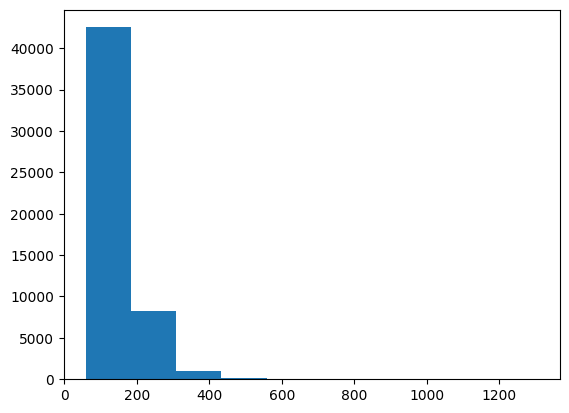

In [2]:
import matplotlib.pyplot as plt

lens = [len(x["prompt"]["input_ids"]) for x in data["train"]]
plt.hist(lens)

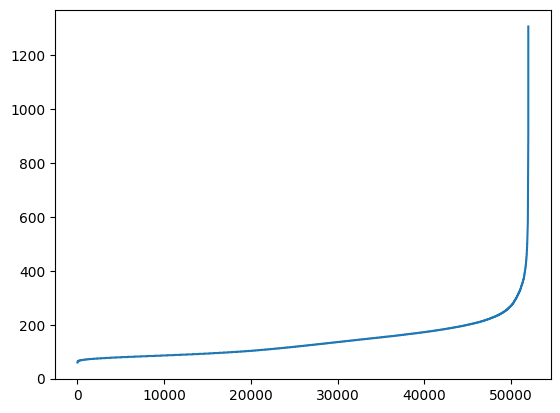

In [3]:
plt.plot(sorted(lens))

In [4]:
len([l for l in lens if l < 256])

49513